In [1]:
using HDF5, ImageView, ReadVTK, LightXML, PyPlot
include("/media/shared/Marc/Gits/multi_quickPIV/src/multi_quickPIV.jl")

LoadError: ArgumentError: Package ImageView not found in current path.
- Run `import Pkg; Pkg.add("ImageView")` to install the ImageView package.

## Loading Data

In [4]:
# LOADING SLICES FROM RUTIAN'S SINGLE LAYER H5 FILES

path   = "/media/shared/Rutian/Headon_layer_data/Headon_single_layer/video_3/"
fid    = h5open( path*"headon_layer_1.h5", "r" ); 
slices = read( fid["data"] ); 
close( fid );

In [3]:
# LOADING SLICES FROM THE 3D VTI VOLUMES

function get_vti_size( filename )
    vtk_file       = VTKFile( filename )
    vtk_cell_data  = get_cell_data(vtk_file)
    vtk_data_array = vtk_cell_data["intensities"]
    data_size, _   = ReadVTK.get_wholeextent(vtk_data_array.vtk_file.xml_file, false)
    return Tuple( data_size .- 1 )
end

function read_vti_vol!( filename, out::Array{T,N} ) where {T,N}
    vtk_file       = VTKFile( filename )
    vtk_cell_data  = get_cell_data(vtk_file)
    vtk_data_array = vtk_cell_data["intensities"]
    data_size, _   = ReadVTK.get_wholeextent(vtk_data_array.vtk_file.xml_file, false)
    out[:] .= T.( get_data( vtk_data_array ) );
    return nothing
end

function get_slices( path, slice_idx=3; tp0=0, tp1=394, typ=UInt16 )
    vol_size = get_vti_size( path*"tp$(tp0).vti" )
    slices   = zeros( typ, vol_size[1:2]..., length(tp0:tp1) ); 
    tmp_vol  = zeros( typ, vol_size ); 
    cont = 1; 
    for t in tp0:tp1
        read_vti_vol!( path * "tp$(t).vti", tmp_vol ); 
        slices[ :, :, cont ] .= tmp_vol[ :, :, slice_idx ];
        cont += 1
    end
    return slices
end

get_slices (generic function with 2 methods)

In [4]:
path = "/media/shared/Headon_data/data/single_channel/video_3/"
@time slices = get_slices( path, 2, typ=UInt16 ); 

 52.786546 seconds (2.13 M allocations: 34.197 GiB, 0.74% gc time, 2.85% compilation time)


In [ ]:
slices = nothing

In [ ]:
ImageView.imshow( slices )

In [2]:
# Read h5 file in which image data is saved. 
using HDF5
function read_h5(folder_path::String)
    h5open(folder_path, "r") do file
        read(file, "data")
    end
end

read_h5 (generic function with 1 method)

In [3]:
# Pick the slice
slices = read_h5("F:/PhD_Franziska/Headon/Headon_results/headon_layer_3_v1.h5")

1024×1024×395 Array{Float32, 3}:
[:, :, 1] =
    34.0     38.0     30.0     64.0  …    76.0   132.0  1129.0    54.0
   191.0    101.0     32.0     60.0      201.0   190.0   311.0  1319.0
    31.0     50.0     12.0     29.0       56.0    56.0   332.0    58.0
   476.0     64.0     79.0     26.0       30.0    43.0    64.0    45.0
   378.0     43.0     49.0     69.0       54.0    68.0   597.0    51.0
    22.0    229.0     36.0    606.0  …   135.0   434.0  1263.0   506.0
   602.0     75.0     68.0     57.0       85.0    65.0    28.0    56.0
    27.0     51.0     65.0    565.0      511.0    34.0    31.0    40.0
   377.0    962.0    332.0    490.0       76.0    62.0    49.0    61.0
    57.0     54.0     44.0     88.0       40.0   296.0    16.0    17.0
    63.0     47.0    250.0     42.0  …    49.0    46.0    53.0  1014.0
  1335.0     37.0     41.0     36.0     1527.0   201.0    57.0   509.0
   425.0     19.0     28.0     54.0       53.0    25.0   604.0   610.0
     ⋮                          

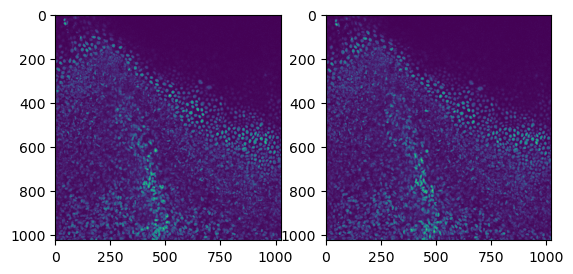

PyObject <matplotlib.image.AxesImage object at 0x000001D90C1403D0>

In [84]:
using PyPlot

img1 = slices[ :, :, 40]; 
img2 = slices[ :, :, 41]; 

subplot( 1, 2, 1 ); imshow(img1)
subplot(1, 2, 2); imshow(img2)

In [30]:
size(img1)
16*63

1008

## Running PIV

In [38]:
#using Pkg
#Pkg.add(path="multi_quickPIV") 
#using multi_quickPIV
#img1 = slices[ :, :, 230 ]; 
#img2 = slices[ :, :, 231 ]; 

pivparams = multi_quickPIV.setPIVParameters( threshold=100, computeSN=true ); 

@time VF, SN = multi_quickPIV.PIV( img1, img2, pivparams)#, precision=32 );  # precision for converting to Float 32 or 64.

  3.691906 seconds (4.57 M allocations: 340.235 MiB, 94.55% compilation time)


([10.0 6.0525802901064765 … -10.0 -1.836939053939977; 3.0 1.9734689943342048 … 10.0 8.99273873536226;;; 4.729379743962232 5.777750393089335 … -1.2956112295354725 0.0; 3.038132445194538 3.017266364743783 … 2.488068614691274 2.0;;; 6.0233278189253525 7.040386589312494 … -1.8097145540462822 -2.459144994327737; 2.730292937491395 2.9419149882099838 … 1.9827077552650412 3.0041295955523832;;; … ;;; 2.0281578713894604 -6.881352382655483 … 3.232572082525225 -5.923439340964325; -2.8292881264517327 -6.007439644569798 … -0.06340767163097638 9.105380900639588;;; 5.9842794453684185 -2.910718454292965 … -0.9814331756234296 0.0; -6.806394107401307 1.921571774997048 … 0.8627039364413793 0.0;;; 8.894808930089077 9.0 … -2.8965056261815914 0.0; -4.8660808543028065 0.0 … -2.1911782743832067 0.0], [1.0092670750971122 0.9282224167118837 … 1.0151799700828832 0.9780424505250674; 0.9932863295645435 1.121435339636259 … 1.0072692000993553 0.9945336126777578; … ; 0.9834879804208476 1.1350921659998765 … 1.108829995

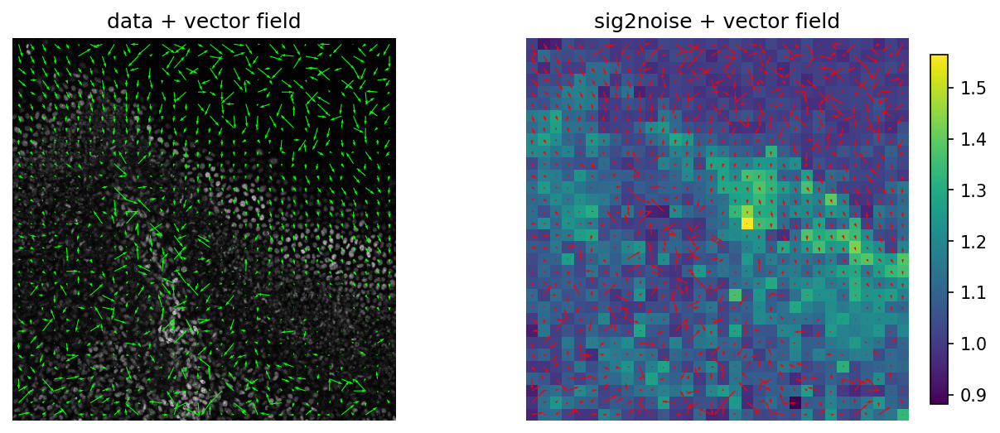

PyObject <matplotlib.quiver.Quiver object at 0x000001D90374F0A0>

In [39]:
IA = multi_quickPIV._isize( pivparams );  
ST = multi_quickPIV._step( pivparams ); 

U = VF[ 1, :, : ]; 
V = VF[ 2, :, : ]; 
ygrid = [ ( y - 1 )*ST[1] + div( IA[1], 2 ) for y in 1:size(U,1), x in 1:size(U,2) ]
xgrid = [ ( x - 1 )*ST[2] + div( IA[2], 2 ) for y in 1:size(U,1), x in 1:size(U,2) ]

PyPlot.figure( figsize=(10,4), dpi=150 ); 

subplot( 1, 2, 1 ); title("data + vector field"); axis(false); 
PyPlot.imshow( img1, cmap="gray" )
PyPlot.quiver( xgrid, ygrid, V, -U, color="lime" )

subplot( 1, 2, 2 ); title("sig2noise + vector field"); axis(false); 
PyPlot.imshow( SN ); colorbar( fraction=0.04 ); 
PyPlot.quiver( V, -U, color="red" )

## Trying to segment the data for masked PIV

In [40]:
include("multiscale_multistep_filter.jl")

multiscale_multigrid_gradient_segment (generic function with 1 method)

In [41]:
using ImageAnalysis

hi 
  0.847395 seconds (197 allocations: 69.360 MiB, 24.39% gc time)


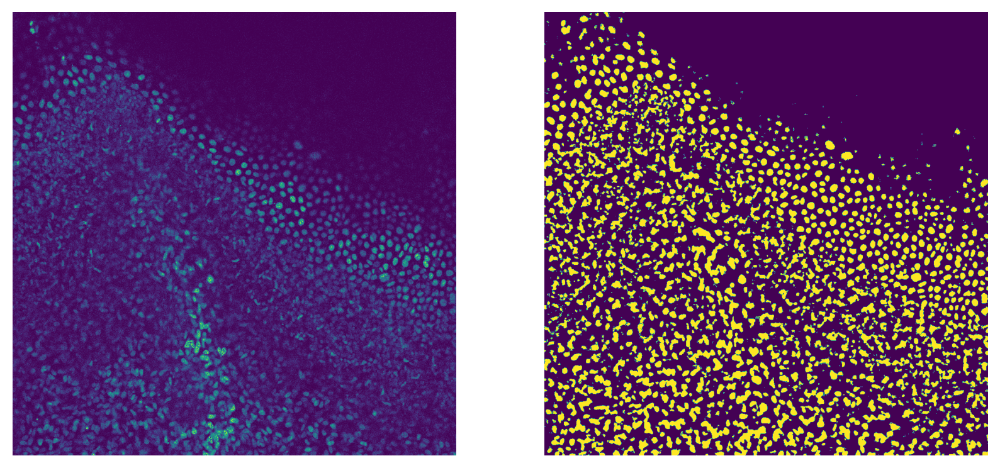

In [85]:
grid_sizes = ( (7,7), )
scales     = ( ((4,4),(2,2)), ) 
steps      = ( ((1,1),(4,4)), ) 

@time out = multiscale_multistep_filter( Float32.( img1 ), grid_sizes=grid_sizes, scales=scales, steps=steps ); 

Δ_low = 4000# expected intensity difference between background and signal
#Δ_up = 30000
α = 1.5# 1.0 - 2.0

mask = out .> ( img1 .+ Δ_low ) .^ α
#mask = (img1 .+ Δ_up) .^α .> out .> ( img1 .+ Δ_low ) .^ α

figure(figsize=(10,5), dpi=200 ); 
subplot( 1, 2, 1 ); axis(false); PyPlot.imshow( img1 ); 
subplot( 1, 2, 2 ); axis(false); PyPlot.imshow( mask ); 

In [86]:
include("multi_quickPIV/src/multi_quickPIV.jl")

#img1 = slices[ :, :, 230 ]; 
#img2 = slices[ :, :, 231 ]; 

pivparams = multi_quickPIV.setPIVParameters( interSize=(32,32), step=(16,16), threshold=0.2, filtFun=(M)->(sum(M)/length(M)) ); 
# consider the IA with percentage of ones obove the threshold.
# --> it woule also useful to not consider the IA with tooo high percentage of ones --> could be noise!
# Is there also a possibe way to set an up threshold?
@time VF, _ = multi_quickPIV.PIV( img1, img2, mask, pivparams, precision=32 ); 

  6.798448 seconds (2.60 M allocations: 325.344 MiB, 75.74% compilation time)


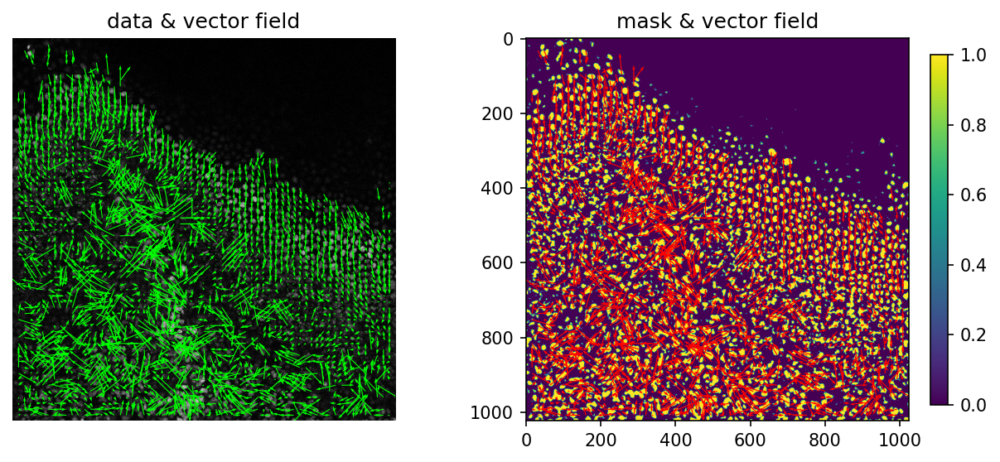

PyObject <matplotlib.quiver.Quiver object at 0x000001DA0F0CFCA0>

In [88]:
IA = multi_quickPIV._isize( pivparams );  
ST = multi_quickPIV._step( pivparams ); 

U = VF[ 1, :, : ]; 
V = VF[ 2, :, : ]; 
M = sqrt.( U .^ 2 .+ V .^ 2 ); # Magnitude of the vectors.
U[ M .== 0 ] .= NaN
V[ M .== 0 ] .= NaN
ygrid = [ ( y - 1 )*ST[1] + div( IA[1], 2 ) for y in 1:size(U,1), x in 1:size(U,2) ]
xgrid = [ ( x - 1 )*ST[2] + div( IA[2], 2 ) for y in 1:size(U,1), x in 1:size(U,2) ]

PyPlot.figure( figsize=(10,4), dpi=150 ); 

subplot( 1, 2, 1 ); title("data & vector field"); axis(false); 
PyPlot.imshow( img1, cmap="gray" )
PyPlot.quiver( xgrid, ygrid, V_, -U_, color="lime", scale=180)

subplot( 1, 2, 2 ); title("mask & vector field");
PyPlot.imshow( mask ); colorbar( fraction=0.04 ); 
PyPlot.quiver( xgrid, ygrid, V_, -U_, color="red", scale=180)

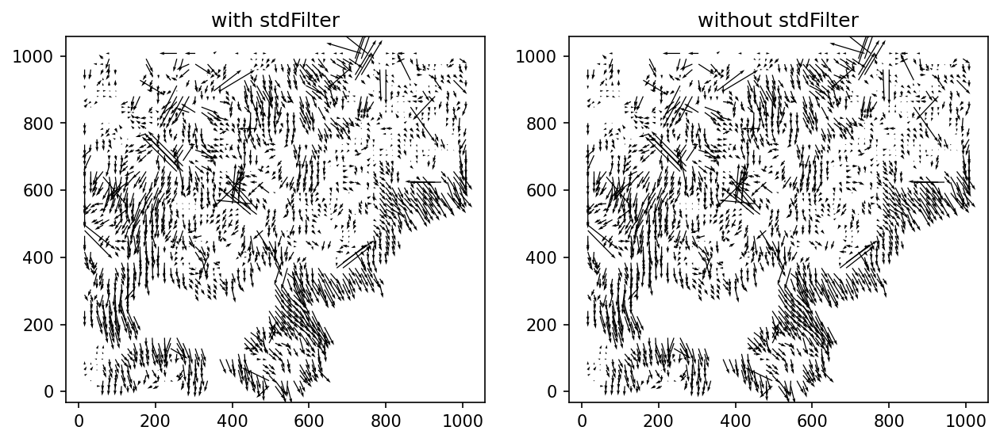

PyObject <matplotlib.quiver.Quiver object at 0x0000015B0EAB3E80>

In [64]:
# Postprocessing 
include("multi_quickPIV/src/postprocessing/postprocessing.jl")
U_, V_ = stdFilter(5, U, V)

PyPlot.figure( figsize=(10,4), dpi=150 ); 
subplot( 1, 2, 1 );title("with stdFilter"); 
PyPlot.quiver( xgrid, ygrid, V_, -U_, scale=120 )

subplot( 1, 2, 2 ); title("without stdFilter");
PyPlot.quiver( xgrid, ygrid, V, -U, scale=120 )

# Postprocessing 
## 1) Mask based on vector length
### But this could also lead to the lost of true long arrows which contains information. 

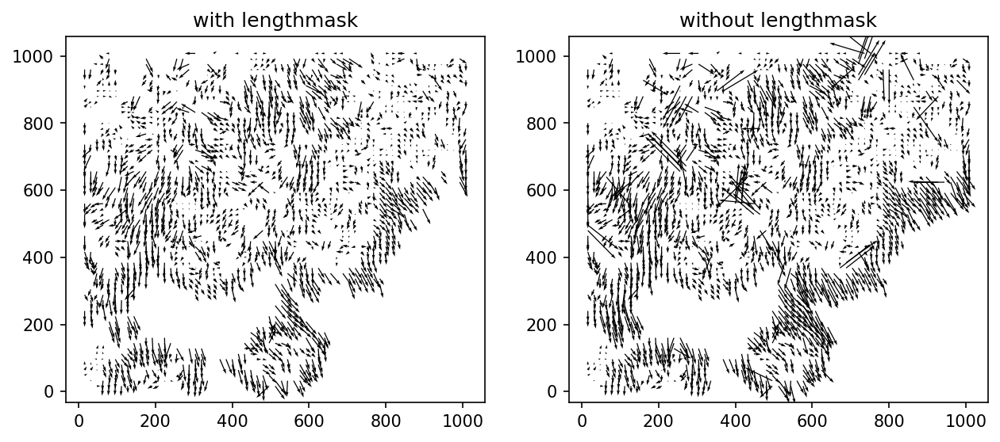

PyObject <matplotlib.quiver.Quiver object at 0x0000015B1030EA40>

In [65]:
M_ = deepcopy(M)
maskM = M_ .< 5
M_ .*= maskM
U_ = deepcopy(U)
V_= deepcopy(V)

U_[ M_ .== 0 ] .= NaN
V_[ M_ .== 0 ] .= NaN

PyPlot.figure( figsize=(10,4), dpi=150 ); 

subplot( 1, 2, 1 );title("with lengthmask"); 
PyPlot.quiver( xgrid, ygrid, V_, -U_, scale=120 )

subplot( 1, 2, 2 ); title("without lengthmask");
PyPlot.quiver( xgrid, ygrid, V, -U, scale=120 )

## 2) Mask based on local mean vectorlength in a grid

In [68]:
rad  = 16               # this defines a 7x7 region around each pixel
N    = (2*rad + 1)^2  # number of pixels in the 7x7 region.
th   =  5.                # removes vectors whose magnitude is th-times higher

mask = zeros( Bool, size( U ) )

63×63 Matrix{Bool}:
 0  0  0  0  0  0  0  0  0  0  0  0  0  …  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0  …  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0  …  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0

In [70]:
for x in 1+rad:size(U,2)-rad, y in 1+rad:size(U,1)-rad
   avgM = ( sum( M[ x-rad:x+rad, y-rad:y+rad ] ) - M[x,y] ) / ( N - 1 )
   mask[y,x] = (M ./ avgM) .< th
end


LoadError: MethodError: [0mCannot `convert` an object of type [92mBitMatrix[39m[0m to an object of type [91mBool[39m

[0mClosest candidates are:
[0m  convert(::Type{Bool}, [91m::PyCall.PyObject[39m)
[0m[90m   @[39m [32mPyCall[39m [90mC:\Users\Rutian Zhou\.julia\packages\PyCall\1gn3u\src\[39m[90m[4mconversions.jl:55[24m[39m
[0m  convert(::Type{T}, [91m::T[39m) where T
[0m[90m   @[39m [90mBase[39m [90m[4mBase.jl:84[24m[39m
[0m  convert(::Type{T}, [91m::Union{Static.StaticBool{N}, Static.StaticFloat64{N}, Static.StaticInt{N}} where N[39m) where T<:Number
[0m[90m   @[39m [33mStatic[39m [90mC:\Users\Rutian Zhou\.julia\packages\Static\6JeQI\src\[39m[90m[4mStatic.jl:420[24m[39m
[0m  ...


## 3) Mask based on global vectorlength  (mean or std)
### This could also probably cancle the true vectors. 

In [47]:
using Statistics
M_g = deepcopy(M)
mean_Mg = Statistics.mean(M_g)
std_Mg = Statistics.std(M_g)

3.5035877f0

In [126]:
maximum( (M_g .- mean_Mg) ) 

12.697274f0

In [50]:
# Mask through n*times global mean length
#m_factor = 4
#mask_Mg = M_g .<= m_factor*mean_Mg 

# Mask through mean + anteil*maximal factor std --> extrem low anteil von std muss genommen werden damit die extrem long arrows are away.
#part = 0.2 # between 0.0 and 1.0
#std_factor = part * maximum( (M_g .- mean_Mg) ) 
# But the theory part here is more meaningfull...

# Mask through mean + n*times std
std_factor = 1

mask_Mg = M_g .<= mean_Mg + std_factor * std_Mg

M_g .*= mask_Mg # Magnitudes of vectors after masking.

63×63 Matrix{Float32}:
 0.0      0.0      0.0      0.0      0.0      …  0.0       0.0       0.0
 0.0      5.87707  5.88307  0.0      0.0         0.0       0.0       0.0
 0.0      0.0      6.44396  0.0      0.0         0.0       0.0       0.0
 0.0      0.0      0.0      0.0      0.0         0.0       0.0       0.0
 0.0      0.0      0.0      0.0      0.0         0.0       0.0       0.0
 0.0      0.0      0.0      0.0      0.0      …  0.0       0.0       0.0
 0.0      0.0      0.0      0.0      0.0         0.0       0.0       0.0
 0.0      0.0      0.0      0.0      0.0         0.0       0.0       0.0
 0.0      0.0      0.0      0.0      4.53509     0.0       0.0       0.0
 0.0      0.0      0.0      4.40055  4.46735     0.0       0.0       0.0
 0.0      0.0      0.0      0.0      4.74394  …  0.0       0.0       0.0
 0.0      0.0      0.0      0.0      4.97027     0.0       0.0       0.0
 5.69273  5.6656   4.29618  5.1639   4.14583     0.0       0.0       0.0
 ⋮                          

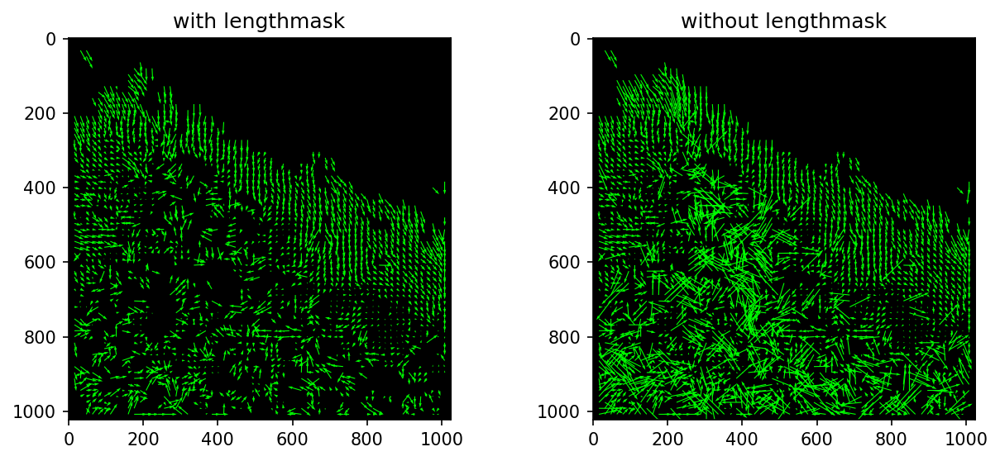

PyObject <matplotlib.quiver.Quiver object at 0x000001D90C873790>

In [51]:
U_g = deepcopy(U)
V_g = deepcopy(V)
U_g[ M_g .== 0 ] .= NaN
V_g[ M_g .== 0 ] .= NaN

PyPlot.figure( figsize=(10,4), dpi=150 ); 
empty = zeros(size(img1,1), size(img1, 2))

subplot( 1, 2, 1 );title("with lengthmask"); 
PyPlot.imshow(empty, cmap="gray")
PyPlot.quiver( xgrid, ygrid, V_g, -U_g, scale=180, color="lime")

subplot( 1, 2, 2 ); title("without lengthmask");
PyPlot.imshow(empty, cmap="gray")
PyPlot.quiver( xgrid, ygrid, V, -U, scale=180, color="lime")

# Movement Averaging for Smoothing the movement to enable the PIV

In [57]:
avg_interval = 3

i = 40
img1 = slices[:, :, i]

for j in 1:avg_interval
    img1 += slices[:, :, i-j] + slices[:, :, i+j]
end
img1 /= avg_interval*2+1

1024×1024 Matrix{Float32}:
 1694.14   1698.0    1497.43    278.286  …    97.5714    88.8571   114.0
 2517.29   2141.71   1594.0     833.0         59.0      175.571    191.714
 1890.14   1802.43   1551.57    835.857       81.0       87.7143    92.2857
 1830.29   1610.57   1748.57    855.714       63.5714    76.1429    88.8571
 2009.29   1448.29   1181.57    901.0        148.429    166.429    245.429
 1761.29   1318.57    880.857   552.0    …   218.143     68.8571   186.571
 1485.71   1129.0     714.143   554.857      112.714    168.857    127.714
 1447.86    842.571   375.286   654.857      118.429     26.1429   234.286
 1377.86    672.714   654.286   726.143       89.2857    91.7143    90.8571
  978.571  1284.14    264.857   526.429       39.7143   180.714     70.2857
  968.571   660.714   908.857   434.857  …   117.429    229.429    114.857
 1250.0     379.571   830.0     335.0        188.0      116.143    205.857
  577.0     815.0     566.143   418.286       89.8571    42.4286   216.

In [61]:
function fig_average(t, interval)
    img = slices[:, :, t]
    for j in 1:interval
        img += slices[:, :, t-j] + slices[:, :, t+j]
    end
    img /= avg_interval*2+1
    return img
end

fig_average (generic function with 1 method)

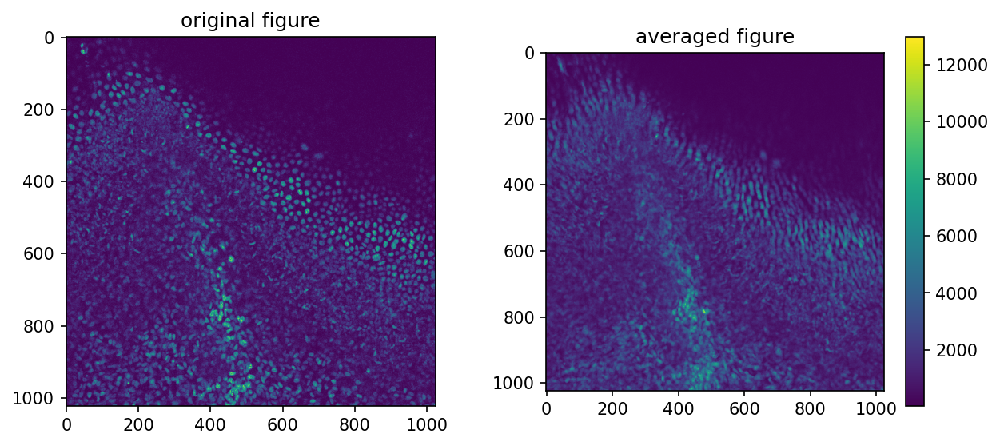

PyObject <matplotlib.colorbar.Colorbar object at 0x000001D91A518250>

In [65]:
PyPlot.figure( figsize=(10,4), dpi=150 ); 

subplot( 1, 2, 1 ); title("original figure"); 
PyPlot.imshow(slices[:, :, i])

subplot( 1, 2, 2 ); title("averaged figure");
PyPlot.imshow(img1)
PyPlot.colorbar()

Apply the multiscale mask on the averaged figure.

hi 
  6.055566 seconds (1.11 M allocations: 144.364 MiB, 89.87% compilation time)


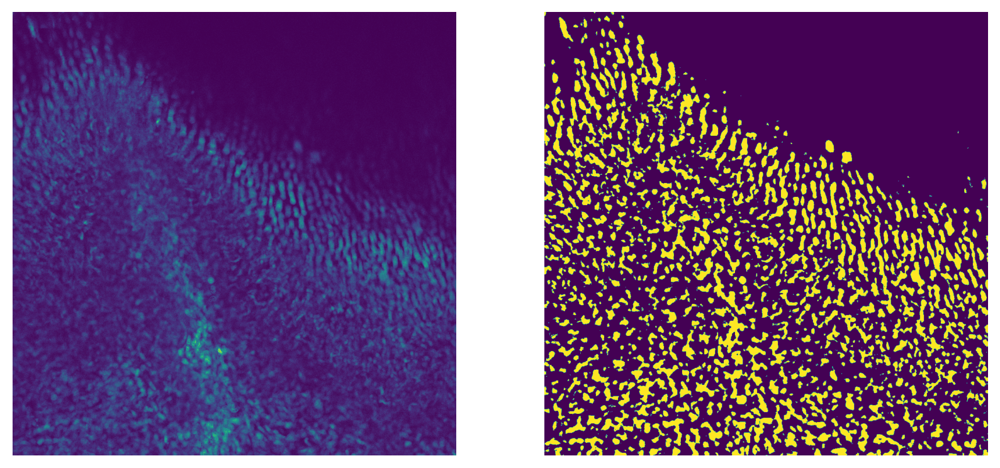

In [64]:
include("multiscale_multistep_filter.jl")

grid_sizes = ( (7,7), )
scales     = ( ((4,4),(2,2)), ) 
steps      = ( ((1,1),(4,4)), ) 

@time out = multiscale_multistep_filter( Float32.( img1 ), grid_sizes=grid_sizes, scales=scales, steps=steps ); 

Δ_low = 4000# expected intensity difference between background and signal
#Δ_up = 30000
α = 1.5# 1.0 - 2.0

mask = out .> ( img1 .+ Δ_low ) .^ α
#mask = (img1 .+ Δ_up) .^α .> out .> ( img1 .+ Δ_low ) .^ α

figure(figsize=(10,5), dpi=200 ); 
subplot( 1, 2, 1 ); axis(false); PyPlot.imshow( img1 ); 
subplot( 1, 2, 2 ); axis(false); PyPlot.imshow( mask ); 

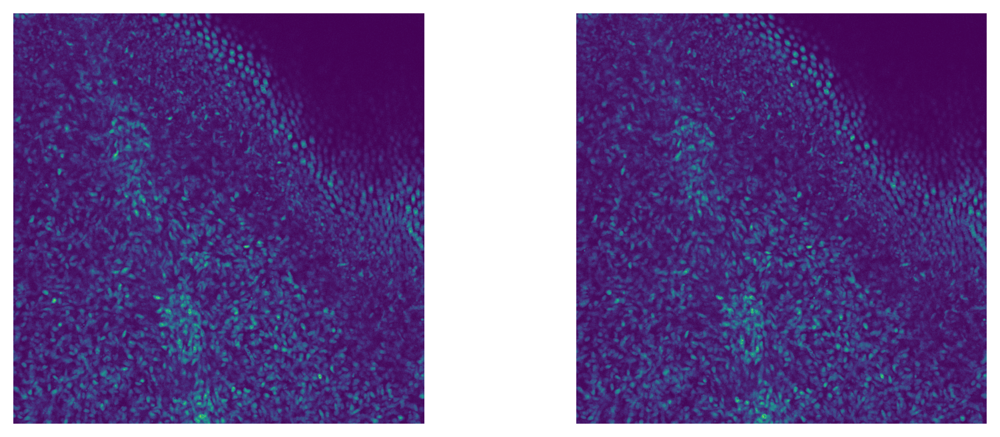

In [141]:
img1 = fig_average(72, 1)
img2 = fig_average(73, 1)
figure(figsize=(10,4), dpi=200 ); 
subplot( 1, 2, 1 ); axis(false); PyPlot.imshow( img1 ); 
subplot( 1, 2, 2 ); axis(false); PyPlot.imshow( img2 ); 

In [142]:
include("multi_quickPIV/src/multi_quickPIV.jl")
pivparams = multi_quickPIV.setPIVParameters( interSize=(32,32), 
            step=(16,16), threshold=0.2, filtFun=(M)->(sum(M)/length(M)) )
IA = multi_quickPIV._isize(pivparams)
ST = multi_quickPIV._step(pivparams)

# Parameters for postprocessing
std_factor = 2
function postprocess(M::Matrix{Float32})
    meanM = Statistics.mean(M)
    stdM = Statistics.std(M)
    mask_M = M .<= meanM + std_factor * stdM
    M .*= mask_M
    return M
end

Δ_low = 2000# expected intensity difference between background and signal
α = 1.3# 1.0 - 2.0

1.3

In [143]:
function img_mask(image)
    out = multiscale_multistep_filter( Float32.( image ), grid_sizes=grid_sizes, scales=scales, steps=steps )
    mask = out .> ( image .+ Δ_low ) .^ α
    return mask
end

img_mask (generic function with 1 method)

hi 
hi 


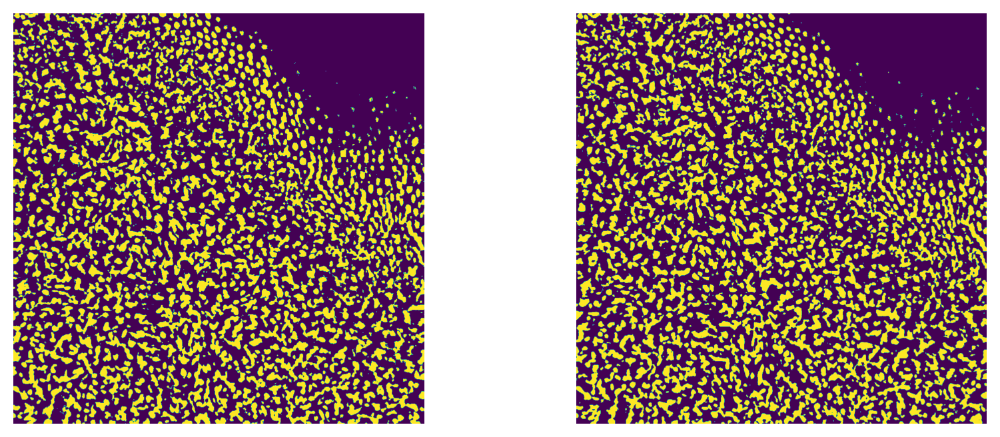

In [144]:
img1_mask = img_mask(img1)
img2_mask = img_mask(img2)

figure(figsize=(10,4), dpi=200 ); 
subplot( 1, 2, 1 ); axis(false); PyPlot.imshow( img1_mask ); 
subplot( 1, 2, 2 ); axis(false); PyPlot.imshow( img2_mask ); 

  1.189497 seconds (808.27 k allocations: 84.379 MiB)


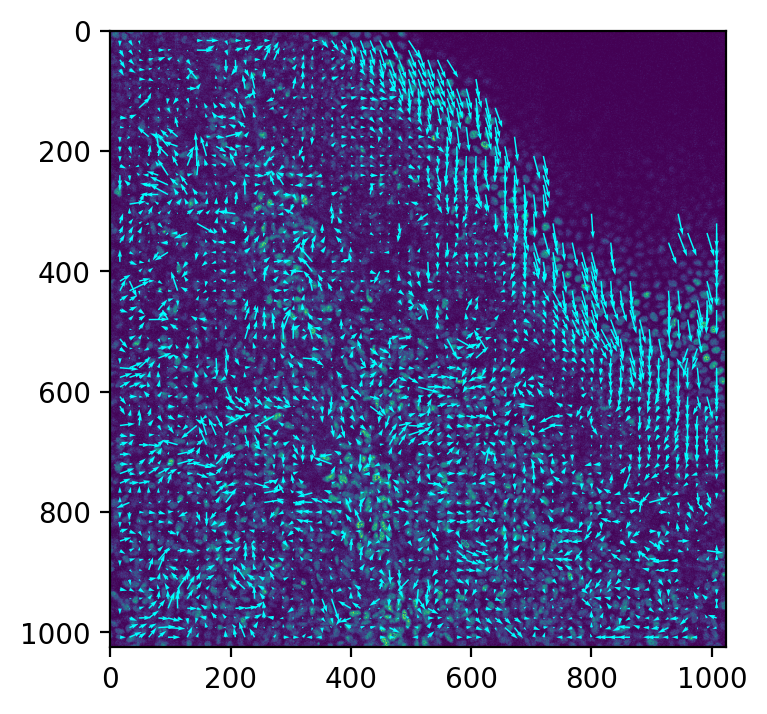

PyObject <matplotlib.quiver.Quiver object at 0x000001DA1BF63E20>

In [148]:
# Running PIV.
@time VF, _ = multi_quickPIV.PIV( img1_mask, img2_mask, pivparams, precision=32 )
    
U = VF[ 1, :, : ]; 
V = VF[ 2, :, : ]; 
M = sqrt.( U .^ 2 .+ V .^ 2 )
    
# Postprocessing 
masked_M = postprocess(M)
    
U[ masked_M .== 0 ] .= NaN
V[ masked_M .== 0 ] .= NaN
ygrid = [ ( y - 1 )*ST[1] + div( IA[1], 2 ) for y in 1:size(U,1), x in 1:size(U,2) ]
xgrid = [ ( x - 1 )*ST[2] + div( IA[2], 2 ) for y in 1:size(U,1), x in 1:size(U,2) ]

figure(figsize=(10,4), dpi=200 )
PyPlot.imshow(slices[:, :, 72])#, cmap="gray")
#imshow(mask)
PyPlot.quiver( xgrid, ygrid, V, -U, color="aqua", scale = 100)